In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import tensorflow as tf
from tensorflow import keras
from keras import layers
from finta import TA

In [2]:
data = pd.read_csv('H:\\nifty 50\\nifty50daily.csv')
data.dropna(inplace = True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3632 entries, 0 to 3661
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       3632 non-null   object 
 1   Open       3632 non-null   float64
 2   High       3632 non-null   float64
 3   Low        3632 non-null   float64
 4   Close      3632 non-null   float64
 5   Adj Close  3632 non-null   float64
 6   Volume     3632 non-null   float64
dtypes: float64(6), object(1)
memory usage: 227.0+ KB


In [3]:
train = data.iloc[:3000,:-1]
test = data.iloc[3000:,:-1]
train['Date'] = pd.to_datetime(train['Date'])
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3000 entries, 0 to 3028
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       3000 non-null   datetime64[ns]
 1   Open       3000 non-null   float64       
 2   High       3000 non-null   float64       
 3   Low        3000 non-null   float64       
 4   Close      3000 non-null   float64       
 5   Adj Close  3000 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 164.1 KB


In [4]:
test

,Date,Open,High,Low,Close,Adj Close
3029,2020-03-02,11387.349609,11433.000000,11036.250000,11132.750000,11132.750000
3030,2020-03-03,11217.549805,11342.250000,11152.549805,11303.299805,11303.299805
3031,2020-03-04,11351.349609,11356.599609,11082.150391,11251.000000,11251.000000
3032,2020-03-05,11306.049805,11389.500000,11244.599609,11269.000000,11269.000000
3033,2020-03-06,10942.650391,11035.099609,10827.400391,10989.450195,10989.450195
...,...,...,...,...,...,...
3657,2022-09-12,17890.849609,17980.550781,17889.150391,17936.349609,17936.349609
3658,2022-09-13,18044.449219,18088.300781,18015.449219,18070.050781,18070.050781
3659,2022-09-14,17771.150391,18091.550781,17771.150391,18003.750000,18003.750000
3660,2022-09-15,18046.349609,18096.150391,17861.500000,17877.400391,17877.400391


In [5]:
from statsmodels.tsa.seasonal import seasonal_decompose

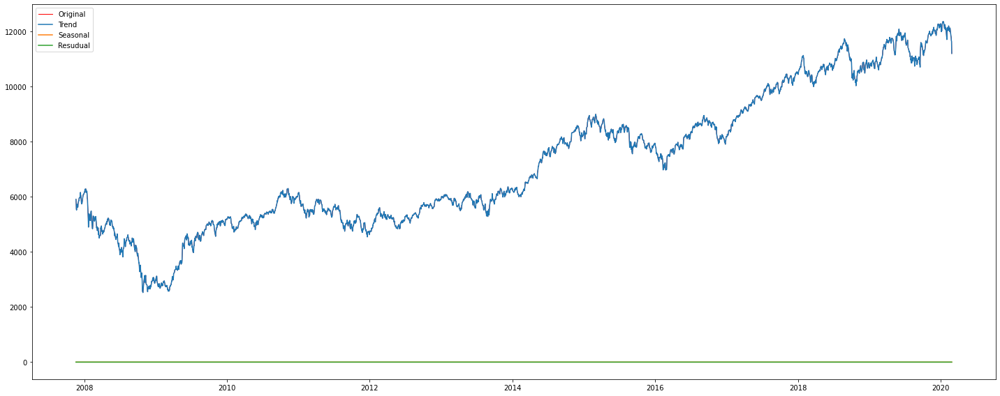

In [6]:
train_df = train.set_index('Date')
#train_df = train[['Date','Close']].set_index('Date')
decomposition = seasonal_decompose(x=train_df['Close'], period=1)
trend = decomposition.trend
seasonal = decomposition.seasonal
resudual = decomposition.resid

fig, ax = plt.subplots(figsize = (20,8))
ax.plot(train_df['Close'], linewidth = 1, c = 'r', label = 'Original')
ax.plot(trend, label = 'Trend')
ax.plot(seasonal, label = 'Seasonal')
ax.plot(resudual, label = 'Resudual')
plt.legend()
plt.tight_layout()
plt.show()

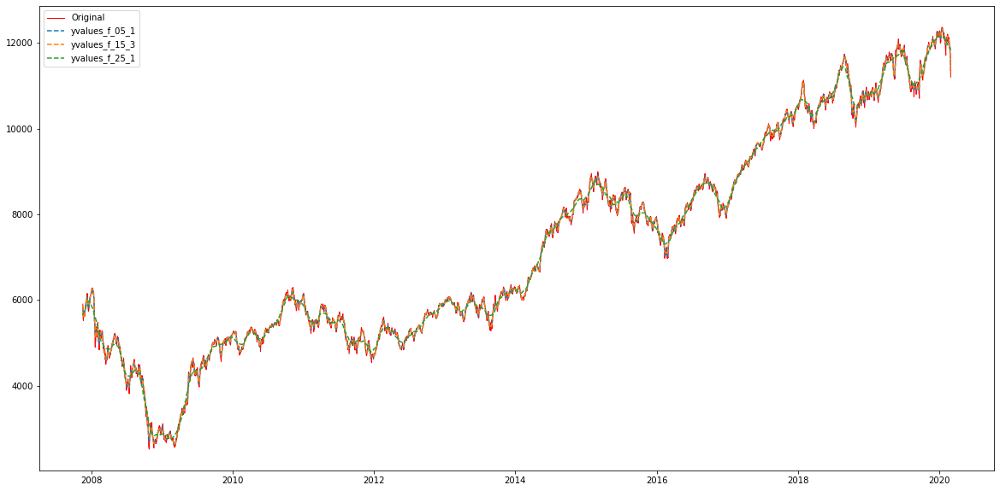

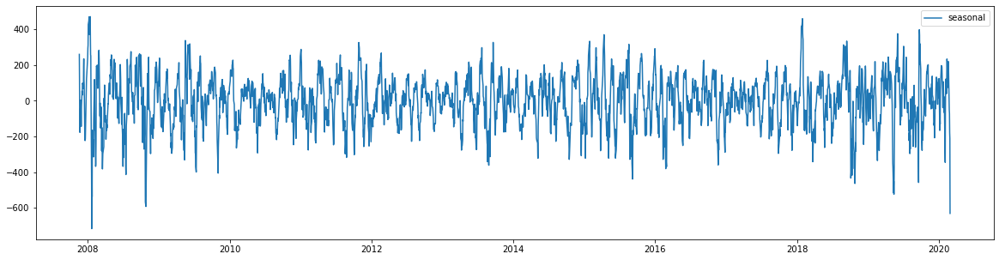

In [7]:
from scipy.signal import savgol_filter
yvalues = train_df['Close'].values

yvalues_f_05_1 = savgol_filter(yvalues,5,1)
yvalues_f_15_3 = savgol_filter(yvalues,15,3)
yvalues_f_25_1 = savgol_filter(yvalues,39,1)

fig, ax = plt.subplots(figsize = (20,10))
ax.plot(train_df.index.values,train_df['Close'], linewidth = 1, c = 'r', label = 'Original')
ax.plot(train_df.index.values,yvalues_f_05_1, label = 'yvalues_f_05_1', linestyle = '--')
ax.plot(train_df.index.values,yvalues_f_15_3, label = 'yvalues_f_15_3', linestyle = '--')
ax.plot(train_df.index.values,yvalues_f_25_1, label = 'yvalues_f_25_1',linestyle = '--')
plt.legend()
plt.show()

plt.figure(figsize = (20,5))
plt.plot(train_df.index.values, yvalues - yvalues_f_25_1, label = 'seasonal')
plt.legend()
plt.show()

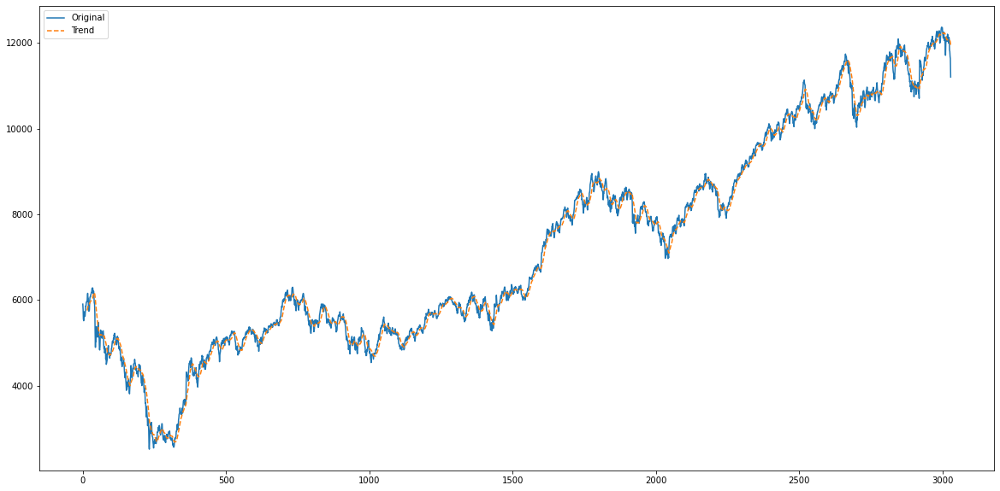

In [8]:
yvalues_gtrend = train_df['Close'].rolling(window = 15).mean()
plt.figure(figsize = (20,10))
plt.plot(train.index.values,train.Close, label = 'Original')
plt.plot(train.index.values[:],yvalues_gtrend,label = 'Trend', linestyle = '--')
plt.legend()
plt.show()

In [9]:
train

,Date,Open,High,Low,Close,Adj Close
0,2007-11-19,5908.049805,5981.799805,5893.799805,5907.649902,5907.649902
1,2007-11-20,5911.250000,5923.700195,5755.799805,5780.899902,5780.899902
2,2007-11-21,5778.799805,5790.049805,5530.850098,5561.049805,5561.049805
3,2007-11-22,5564.649902,5608.649902,5394.350098,5519.350098,5519.350098
4,2007-11-23,5524.299805,5638.600098,5514.750000,5608.600098,5608.600098
...,...,...,...,...,...,...
3024,2020-02-24,12012.549805,12012.549805,11813.400391,11829.400391,11829.400391
3025,2020-02-25,11877.500000,11883.049805,11779.900391,11797.900391,11797.900391
3026,2020-02-26,11738.549805,11783.250000,11639.599609,11678.500000,11678.500000
3027,2020-02-27,11661.250000,11663.849609,11536.700195,11633.299805,11633.299805


In [10]:
train = data.iloc[:3000,:-1]
fig = px.line(train, x = 'Date', y = 'Close')
fig.show()
rsi = TA.STOCHRSI(train).dropna()
rsi_ = (rsi - rsi.mean())/np.std(rsi)
#rsi = rsi - rsi.mean()
scaled_close = (train.Close - train.Close.mean())/np.std(train.Close)
fig = px.line(x = train.Date[14:], y = [scaled_close[14:],rsi_])
fig.show()
ffty = np.fft.fft(rsi_.values, len(rsi.values))
fftx = np.fft.fftfreq(len(rsi.values))

ffty_ = np.abs(ffty[:len(ffty)//2])
fftx_ = fftx[:len(fftx)//2]
px.line(x = fftx_, y = ffty_)

In [70]:
max(ffty)

(310.8387089670545+598.6017621492579j)

D:\anaconda\lib\site-packages\matplotlib\cbook\__init__.py:1298: ComplexWarning:

Casting complex values to real discards the imaginary part



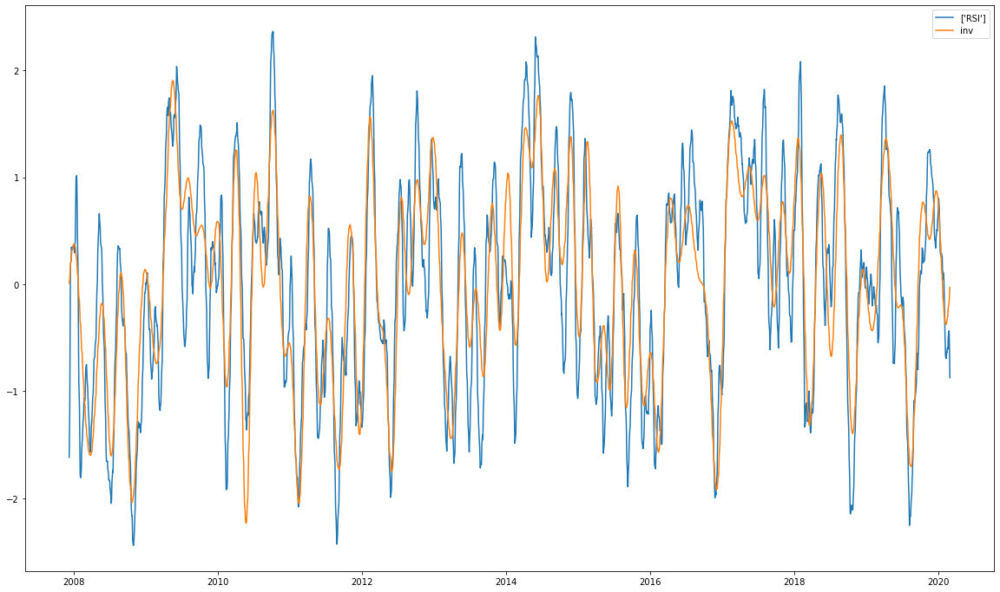

In [79]:
ind = np.abs(ffty)>200
cffty = ffty * ind
fhat = ind * ffty
inv_y = np.fft.ifft(fhat)
plt.figure(figsize = (20,12))
plt.plot(pd.to_datetime(train.Date[14:]), rsi_, label = ['RSI'])
plt.plot(pd.to_datetime(train.Date[14:]), inv_y, label = 'inv')
plt.legend()
plt.show()

D:\anaconda\lib\site-packages\matplotlib\cbook\__init__.py:1298: ComplexWarning:

Casting complex values to real discards the imaginary part



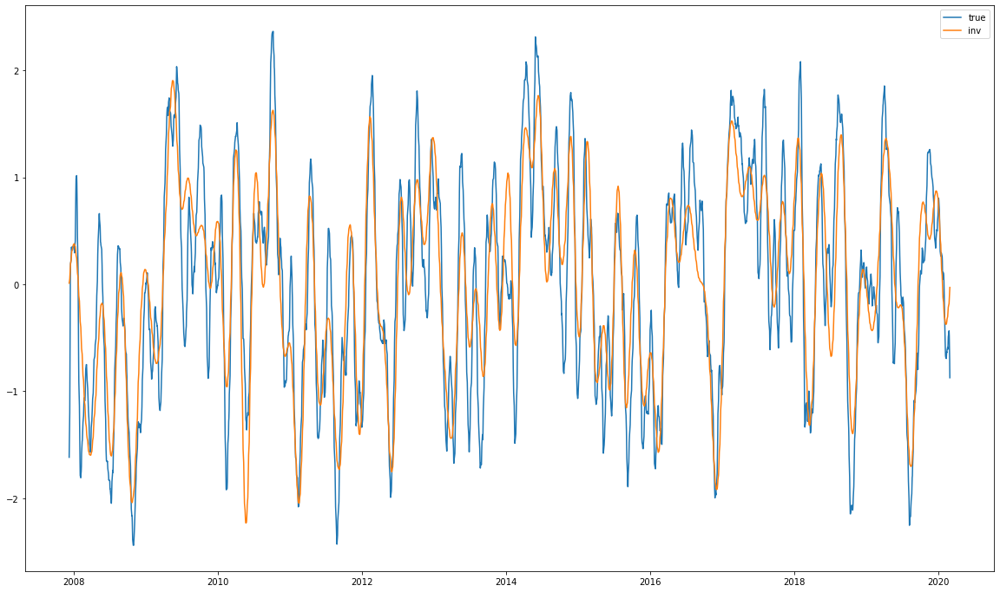

In [80]:
fhat = np.fft.fft(rsi_.values, len(rsi.values))
fhat_abs = np.abs(fhat[:len(fhat)//2])
inv_fft = np.fft.ifft(fhat)
plt.figure(figsize = (20,12))
plt.plot(pd.to_datetime(train.Date[14:]), rsi_, label = 'true')
plt.plot(pd.to_datetime(train.Date[14:]), inv_y,label = 'inv')
plt.legend()
plt.show()

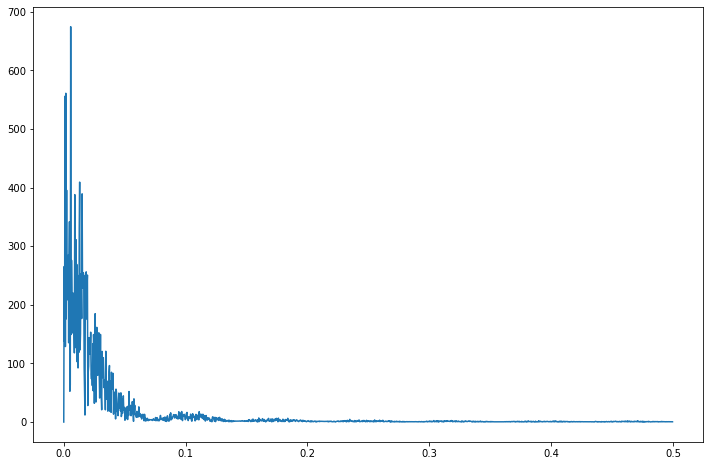

In [81]:
yhat = np.fft.fft(rsi_)
yhat_abs = np.abs(yhat[:len(yhat)//2])
x_freq = np.fft.fftfreq(len(rsi))
x_freq_ = x_freq[:len(x_freq)//2]
plt.figure(figsize = (12,8))
plt.plot(x_freq_,yhat_abs)
plt.show()

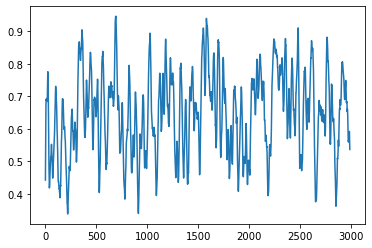

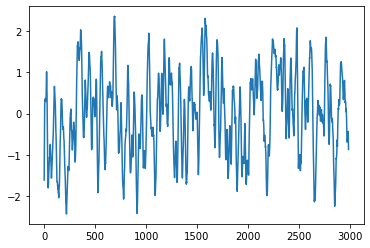

In [82]:
plt.plot(np.arange(len(rsi)), rsi.values)
plt.show()
plt.plot(np.arange(len(rsi_)), rsi_.values)
plt.show()

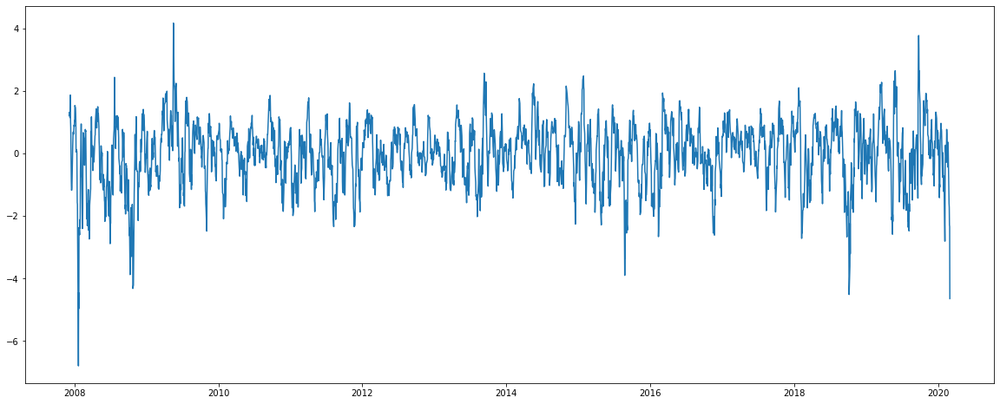

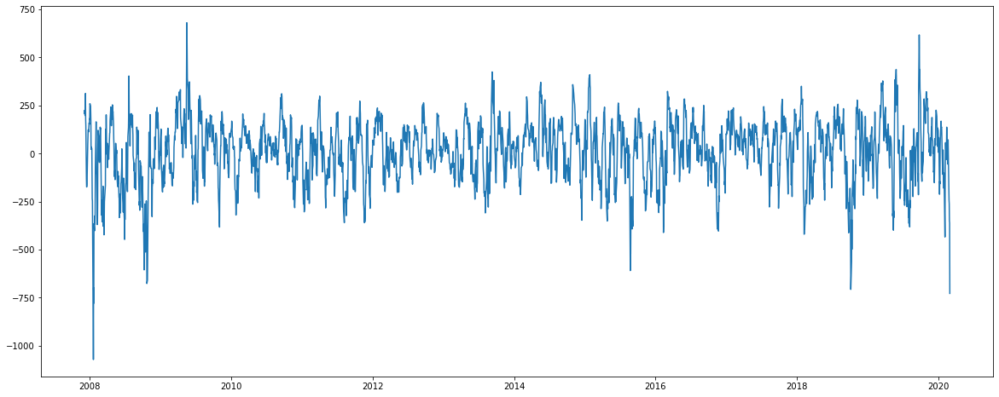

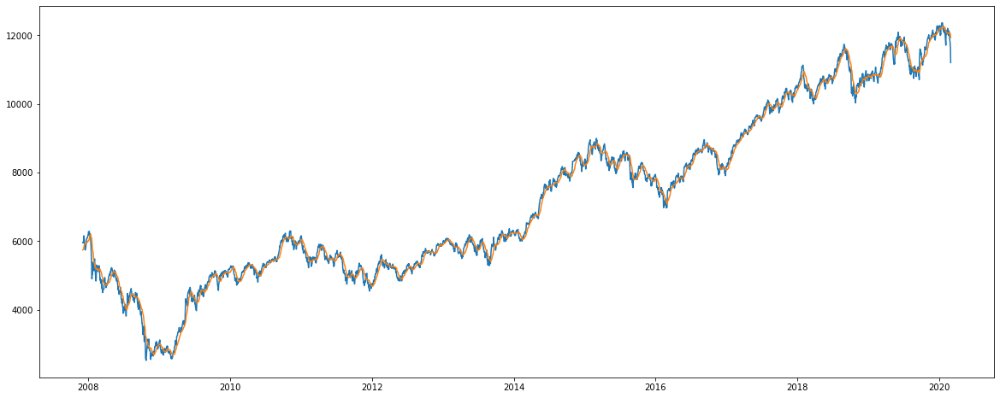

In [84]:
train['Date'] = pd.to_datetime(train['Date'])
sma = TA.SMA(train,14).dropna()
x = 0
dc = train.Close[x+13:] - sma[x:]
plt.figure(figsize = (20,8))
plt.plot(train.Date[x+13:], (dc - dc.mean())/np.std(dc))
plt.show()
plt.figure(figsize = (20,8))
plt.plot(train.Date[x+13:], dc, label = 'DC')
plt.show()
plt.figure(figsize = (20,8))
plt.plot(train.Date[x+13:], train.Close[x+13:])
plt.plot(train.Date[x+13:], sma[x:])
plt.show()

In [85]:
fig = px.line(x = train.Date[x+13:], y = (dc - dc.mean())/np.std(dc), title = 'scaled_DC')
fig.show()
fig = px.line(x = train.Date[x+13:], y = [train.Close[x+13:],sma[x:]], title = 'scaled_DC')
fig.show()

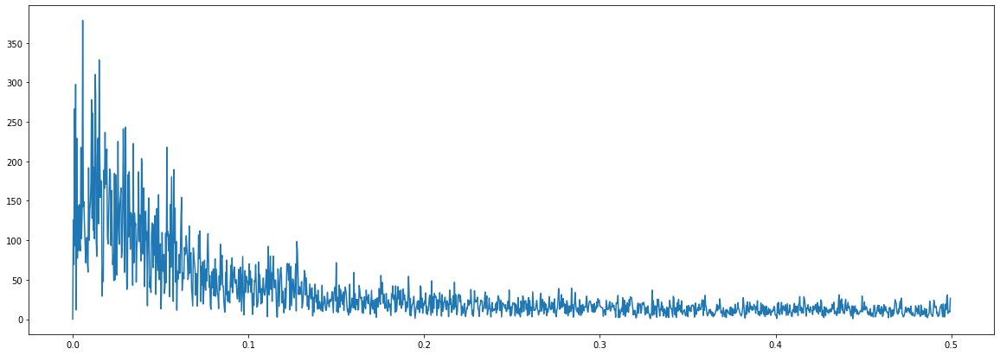

In [86]:
scaled_dc = (dc - dc.mean())/np.std(dc)
fhat = np.fft.fft(scaled_dc)
fhat_ = np.abs(fhat[:len(fhat)//2])
fft_x = np.fft.fftfreq(len(scaled_dc))
fft_x_ = fft_x[:len(fft_x)//2]
plt.figure(figsize = (20,7))
plt.plot(fft_x_,fhat_)

D:\anaconda\lib\site-packages\matplotlib\cbook\__init__.py:1298: ComplexWarning:

Casting complex values to real discards the imaginary part



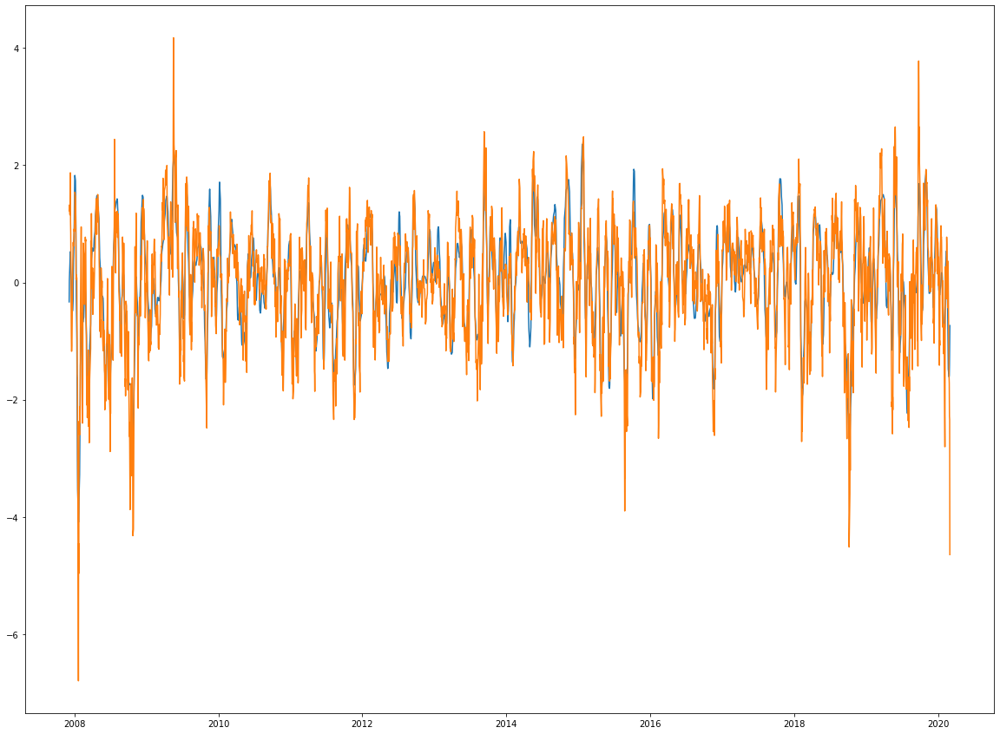

In [94]:
index = np.abs(fhat)>100
filtered_fhat = index * fhat
inv_f = np.fft.ifft(filtered_fhat)
plt.figure(figsize = (20,15))
plt.plot(train.Date[x+13:], inv_f)
plt.plot(train.Date[x+13:], scaled_dc)
plt.show()

In [95]:
px.line(x = train.Date[x+13:], y = [scaled_dc, np.real(inv_f), ])

In [97]:
fig = px.line(x = train.Date[x+13:], y = [train.Close[x+13:],sma[x:]], title = 'scaled_DC')
fig.show()

In [98]:
inv_fft = np.real(inv_f)
print(inv_fft.shape)
train_seq = inv_fft[:-500]
test_seq = inv_fft[-500:]
in_len, out_len = 70, 30
xy = []
for i in range(100,len(train_seq)+1):
    xy.append(train_seq[i - 100:i])
x_train = [x[:70] for x in xy]
y_train = [x[70:] for x in xy]
x_train = np.array(x_train)
x_train = x_train.reshape(-1,70,1)
y_train = np.array(y_train)
print(x_train.shape, y_train.shape)

(2987,)
(2388, 70, 1) (2388, 30)


In [99]:
xy_ = []
for i in range(100,len(test_seq)+1):
    xy_.append(test_seq[i - 100:i])
x_test = [x[:70] for x in xy_]
y_test = [x[70:] for x in xy_]
x_test = np.array(x_test)
x_test = x_test.reshape(-1,70,1)
y_test = np.array(y_test)

In [100]:
import tensorflow as tf
from tensorflow import keras
from keras.layers import LSTM, Dropout,Input,Dense, Bidirectional, GRU

In [146]:
model = keras.models.Sequential([
    Input(shape = [70,1], name = 'Input'),
    Bidirectional(GRU(50, return_sequences=True)),
    Bidirectional(GRU(33)),
    Dense(30)
])
model.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_28 (Bidirecti  (None, 70, 100)          15900     
 onal)                                                           
                                                                 
 bidirectional_29 (Bidirecti  (None, 66)               26730     
 onal)                                                           
                                                                 
 dense_14 (Dense)            (None, 30)                2010      
                                                                 
Total params: 44,640
Trainable params: 44,640
Non-trainable params: 0
_________________________________________________________________


In [147]:
model.compile(loss = 'mean_absolute_error', optimizer = keras.optimizers.RMSprop(learning_rate=0.003),
              metrics = 'mean_absolute_error')
model.fit(x_train, y_train, epochs = 10, batch_size = 10, validation_split = 0.1)

Epoch 1/10
215/215 [==============================] - 37s 95ms/step - loss: 0.5654 - mean_absolute_error: 0.5654 - val_loss: 0.4027 - val_mean_absolute_error: 0.4027
Epoch 2/10
215/215 [==============================] - 17s 80ms/step - loss: 0.5188 - mean_absolute_error: 0.5188 - val_loss: 0.3589 - val_mean_absolute_error: 0.3589
Epoch 3/10
215/215 [==============================] - 17s 81ms/step - loss: 0.5000 - mean_absolute_error: 0.5000 - val_loss: 0.3631 - val_mean_absolute_error: 0.3631
Epoch 4/10
215/215 [==============================] - 16s 76ms/step - loss: 0.4811 - mean_absolute_error: 0.4811 - val_loss: 0.3896 - val_mean_absolute_error: 0.3896
Epoch 5/10
215/215 [==============================] - 16s 74ms/step - loss: 0.4694 - mean_absolute_error: 0.4694 - val_loss: 0.3724 - val_mean_absolute_error: 0.3724
Epoch 6/10
215/215 [==============================] - 16s 74ms/step - loss: 0.4574 - mean_absolute_error: 0.4574 - val_loss: 0.4800 - val_mean_absolute_error: 0.4800
Epoc

In [148]:
predicted = model.predict(x_test)

13/13 [==============================] - 4s 28ms/step


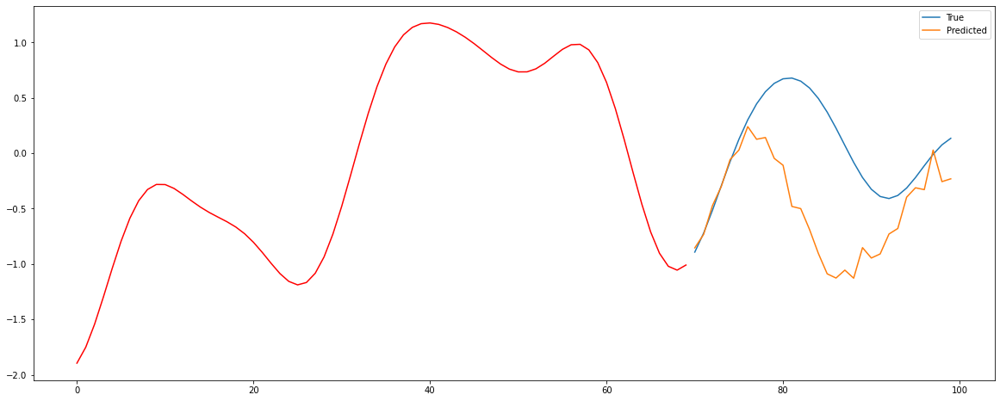

In [149]:
plt.figure(figsize = (20,8))
plt.plot(np. arange(len(x_test[0][:,0])),x_test[0][:,0],c = 'r')
plt.plot(np.arange(70,100),y_test[0], label = 'True')
plt.plot(np.arange(70,100), predicted[0], label = 'Predicted')
plt.legend()
plt.show()

In [150]:
x_test.shape[0]

401

0


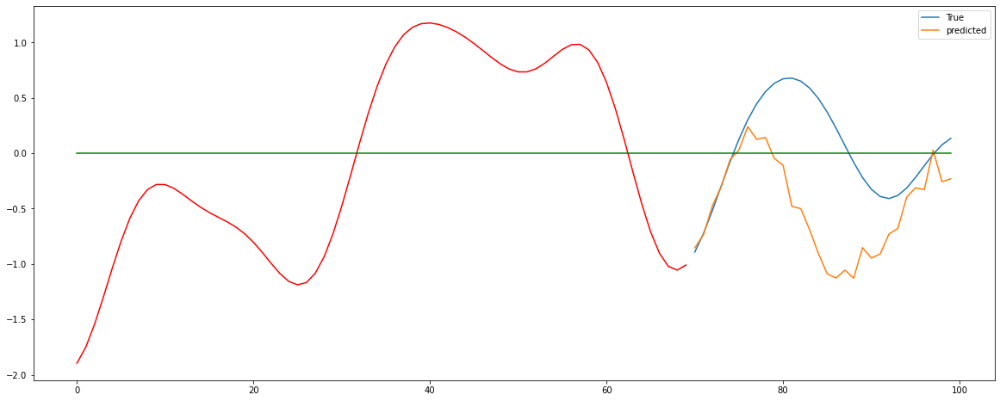

10


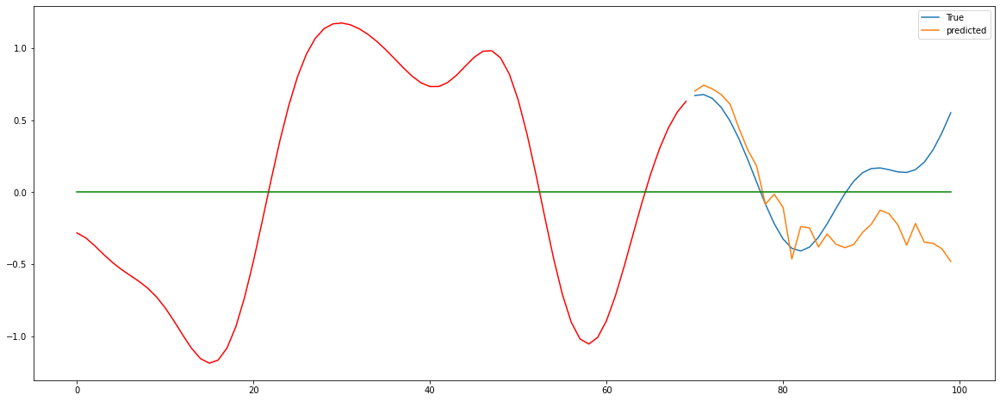

20


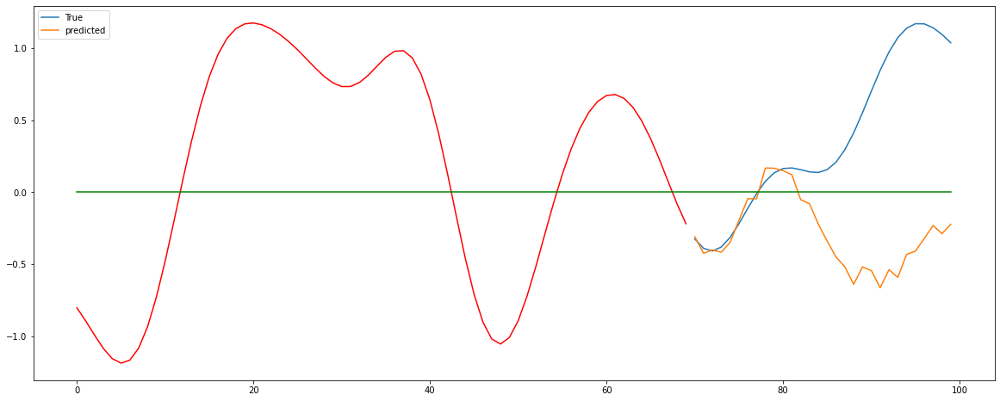

30


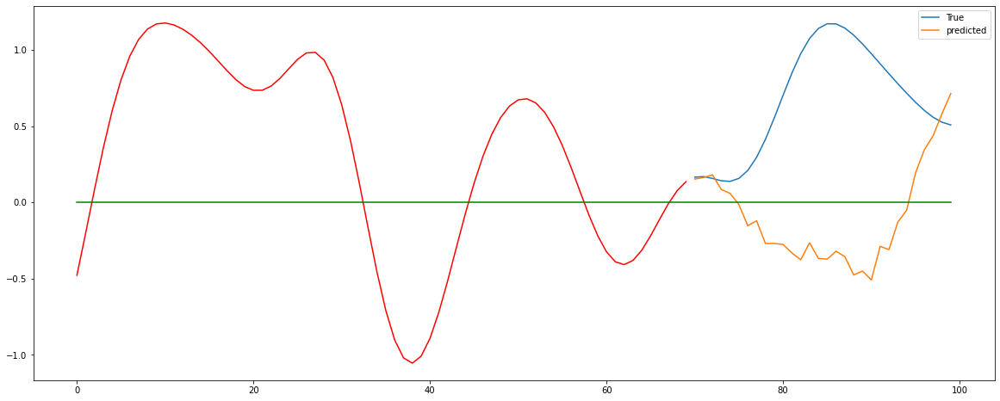

40


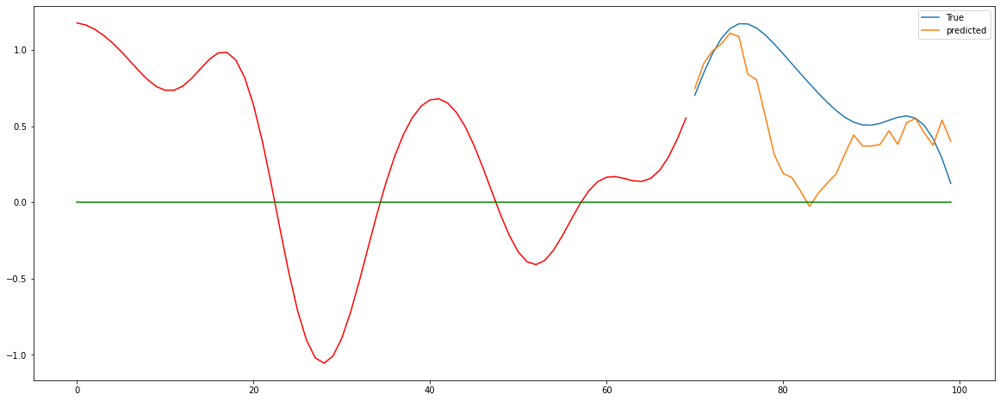

50


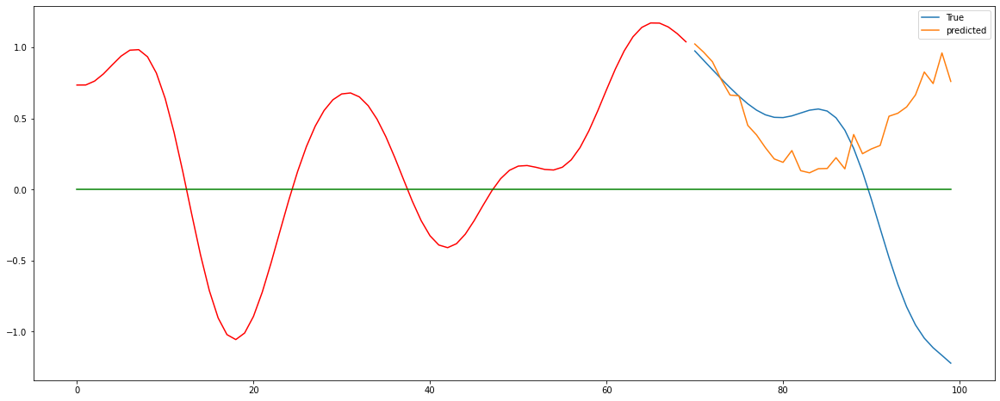

60


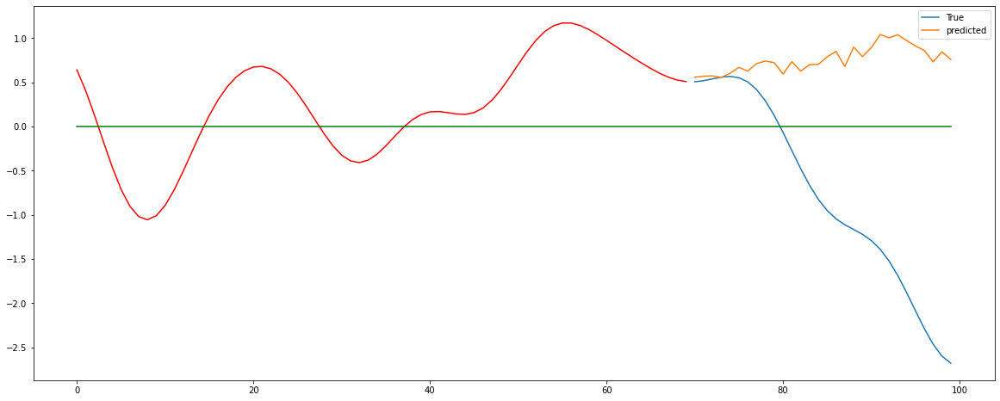

70


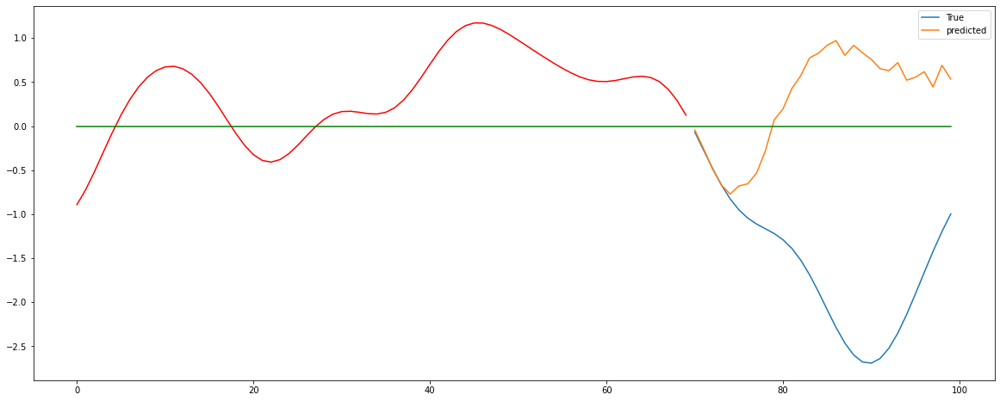

80


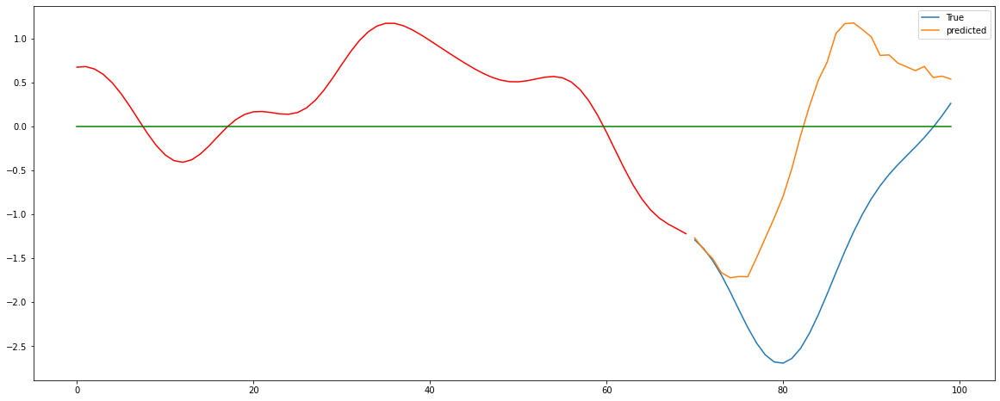

90


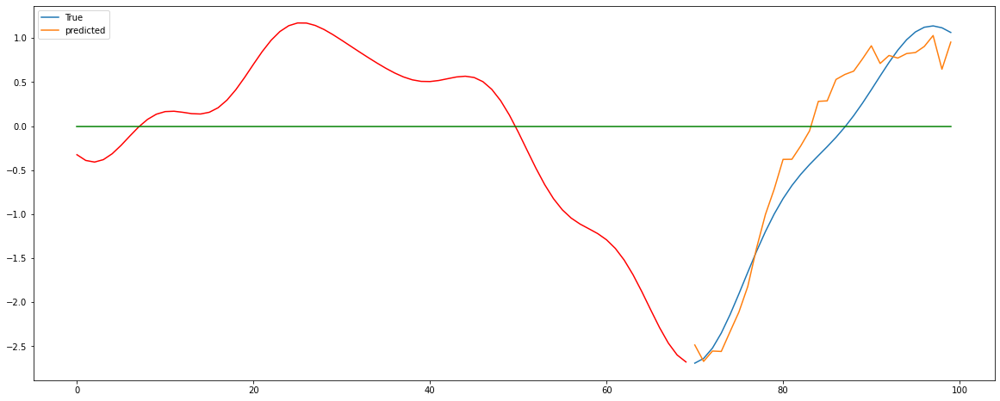

100


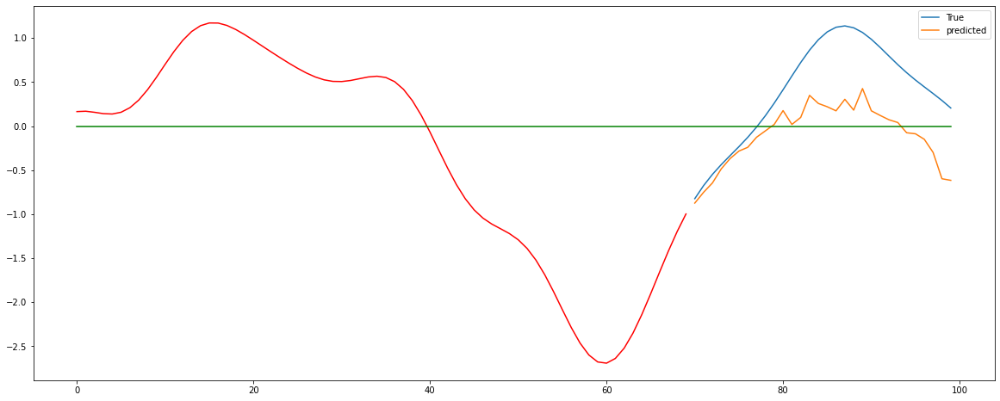

110


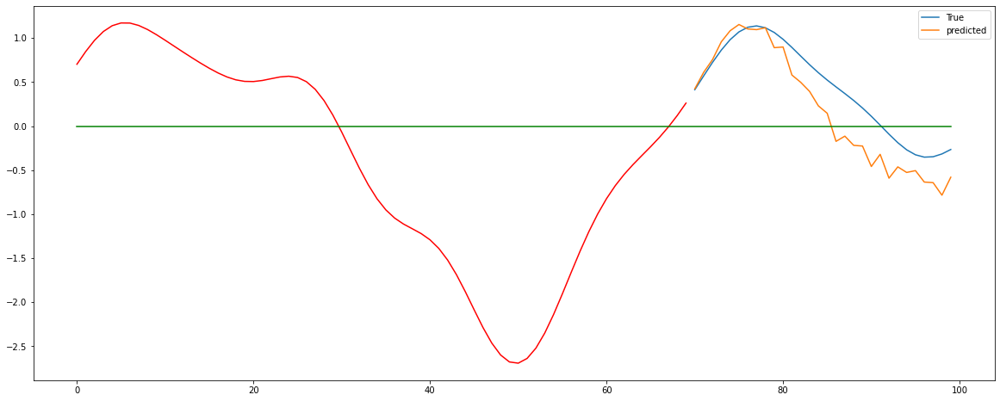

120


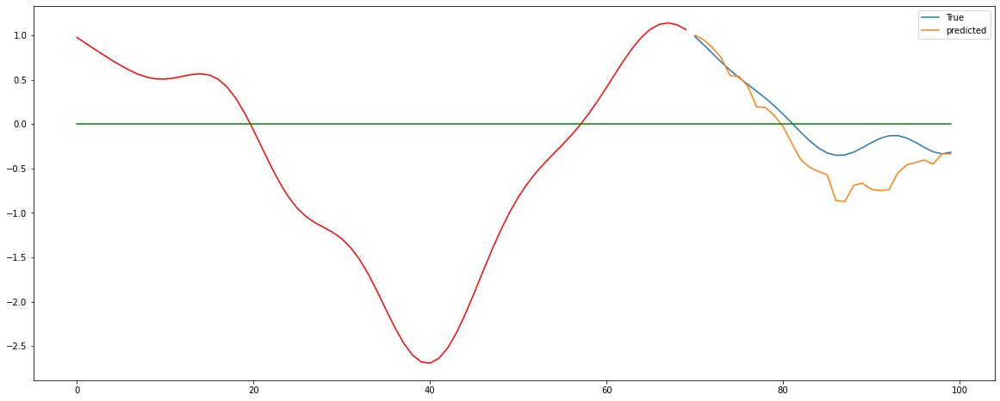

130


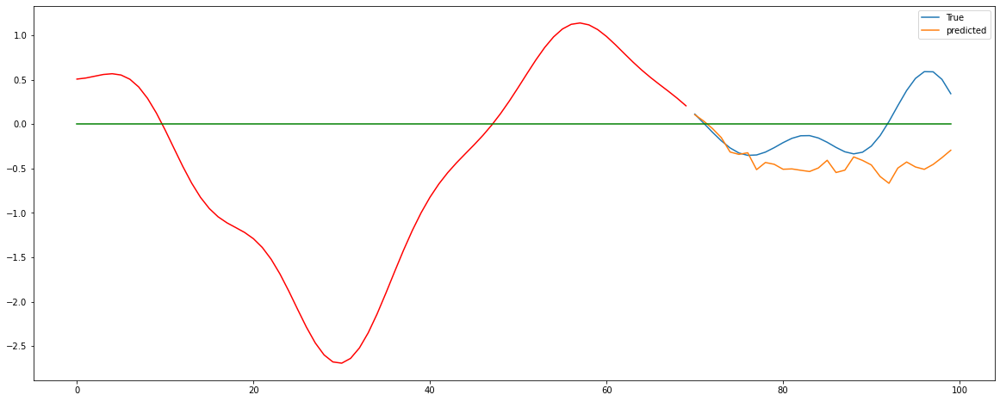

140


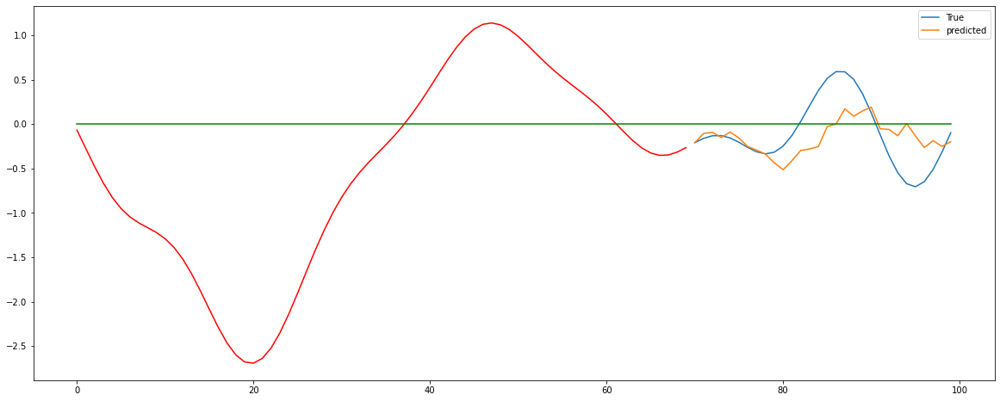

150


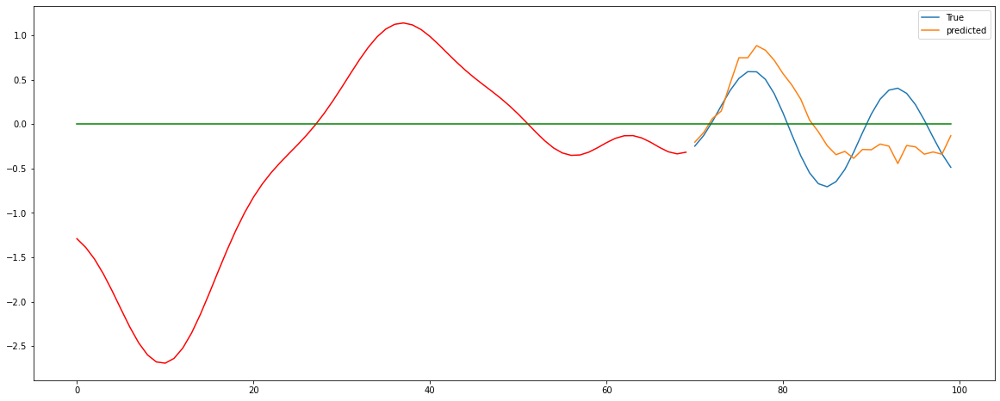

160


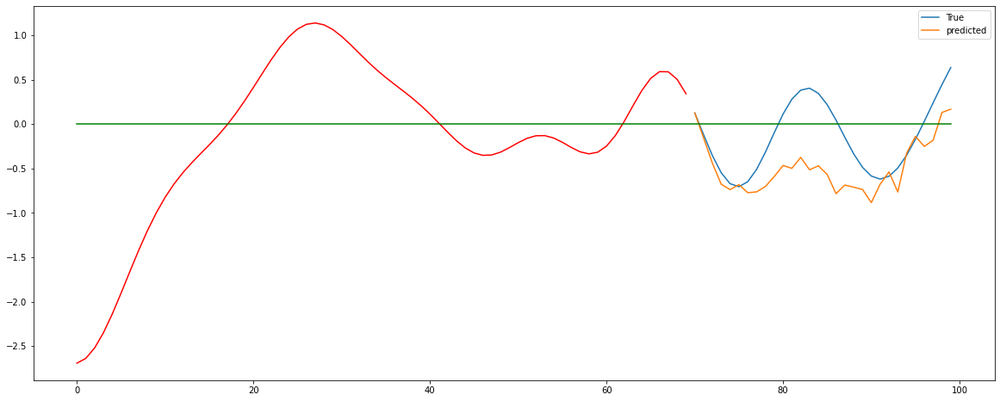

170


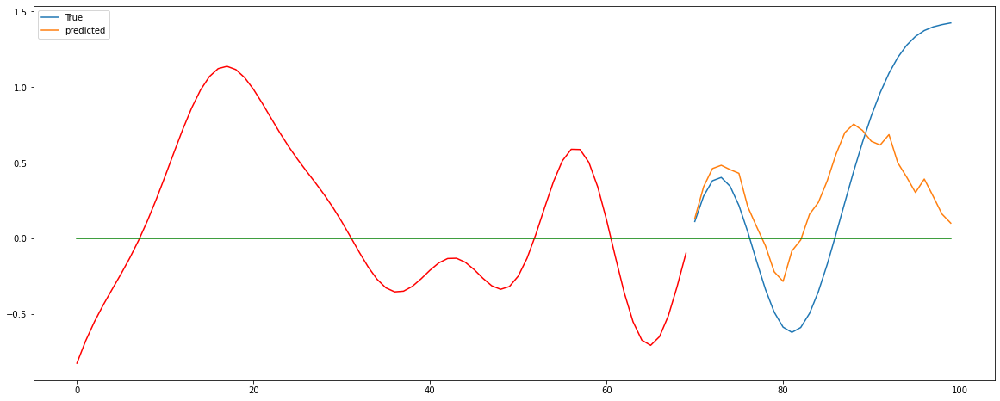

180


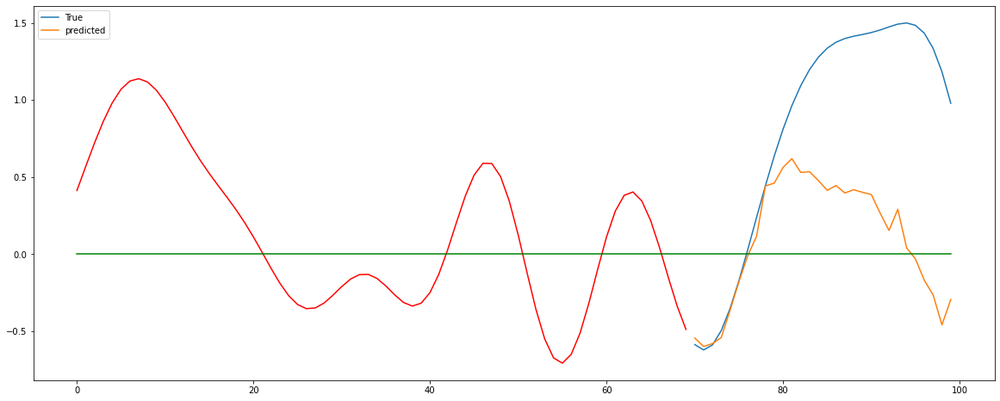

190


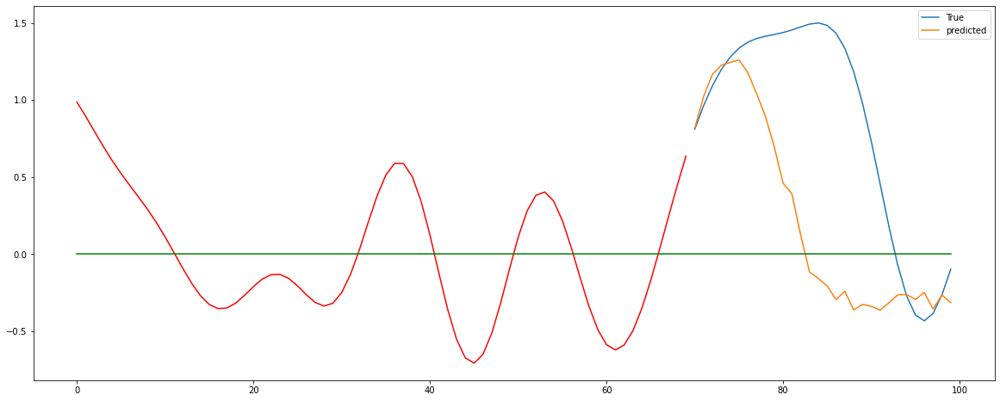

200


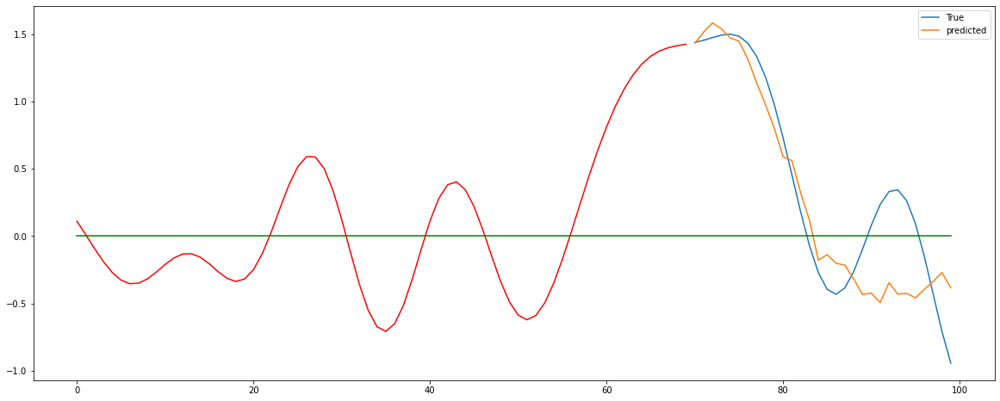

210


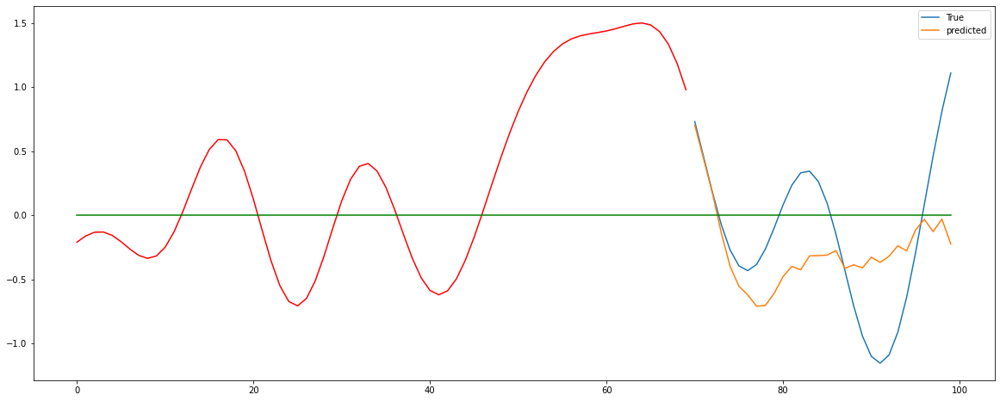

220


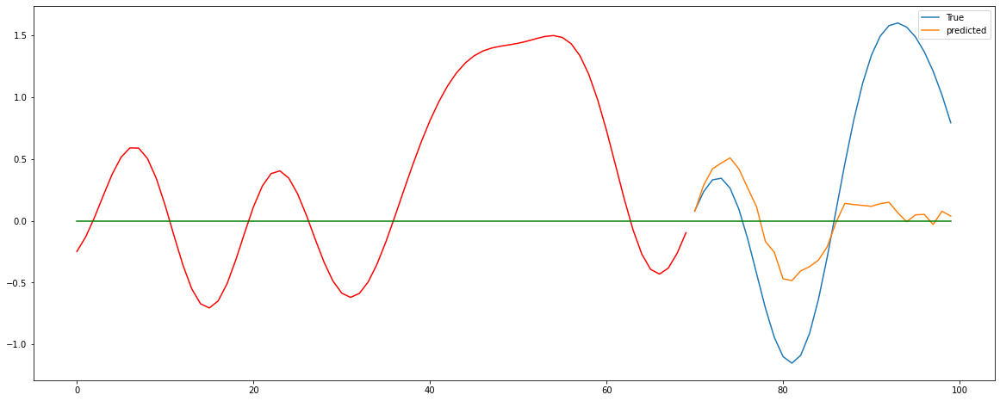

230


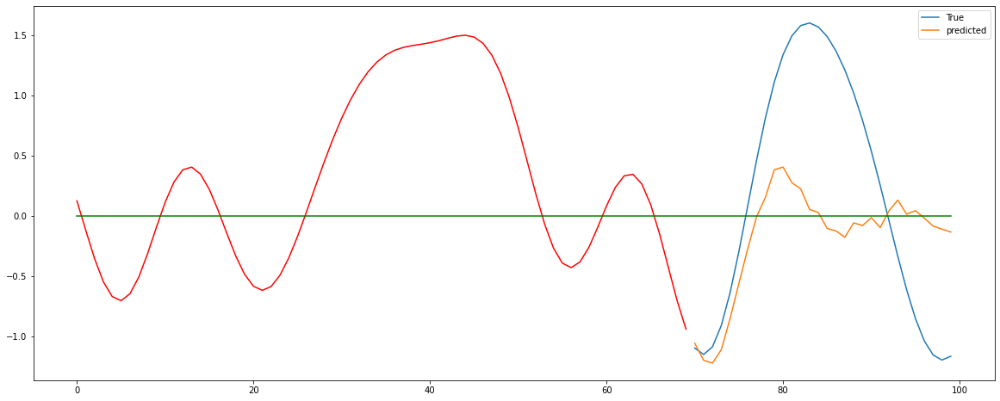

240


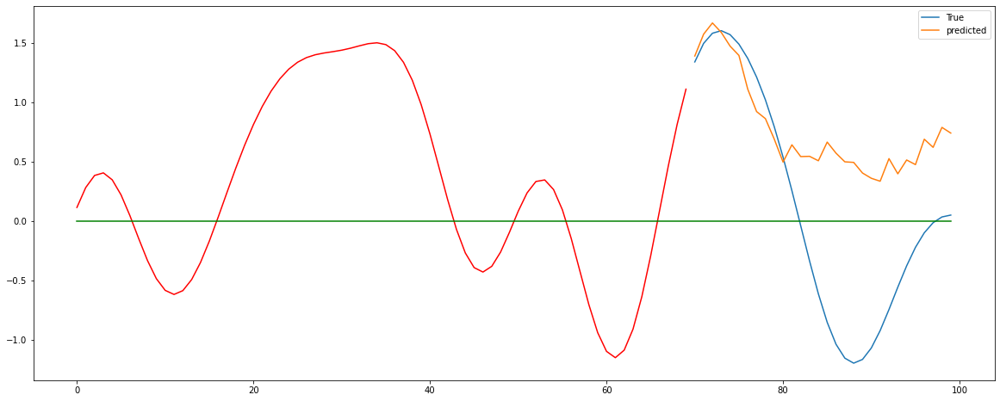

250


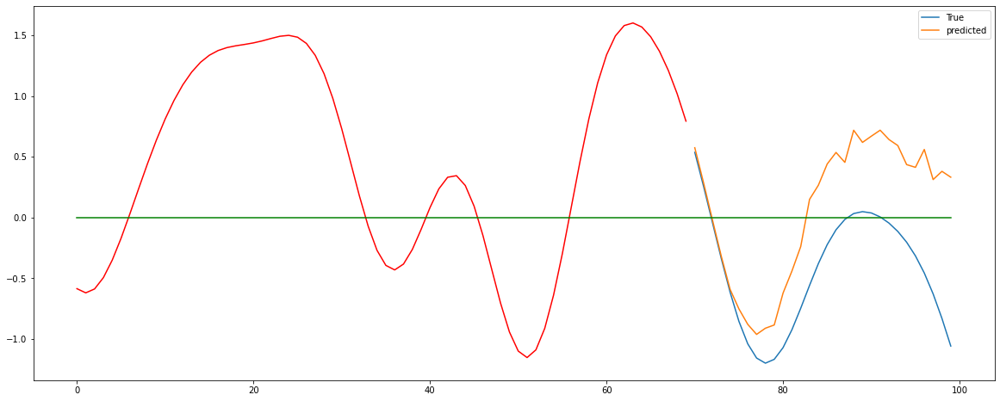

260


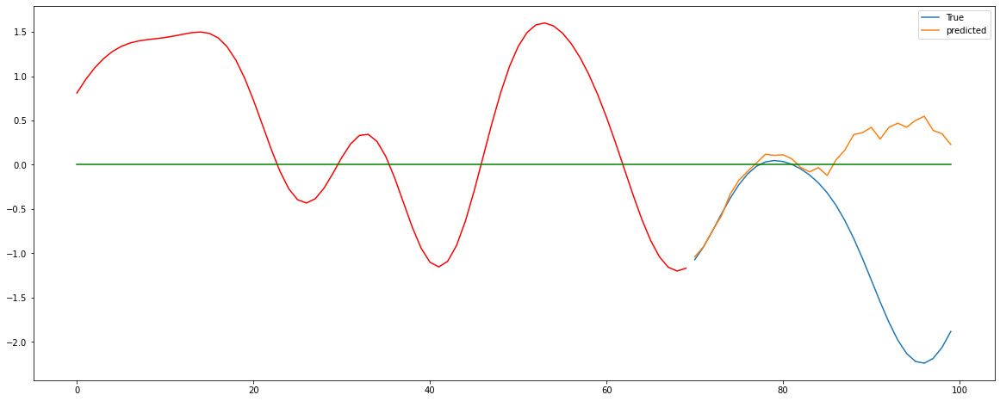

270


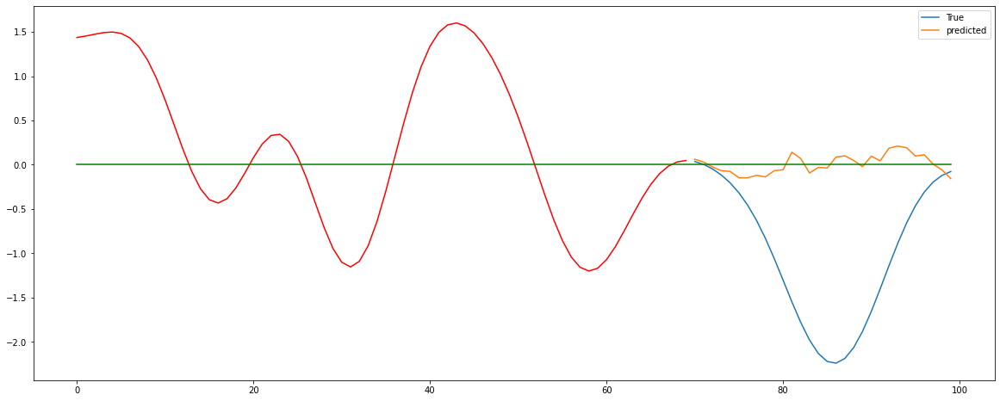

280


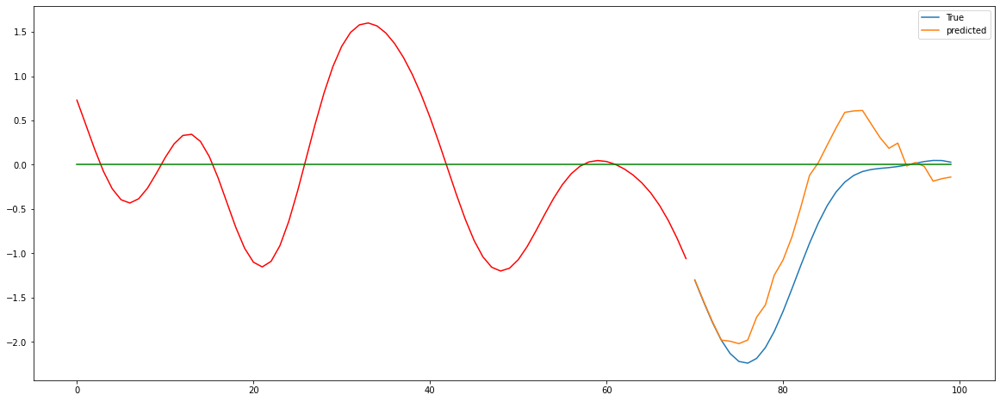

290


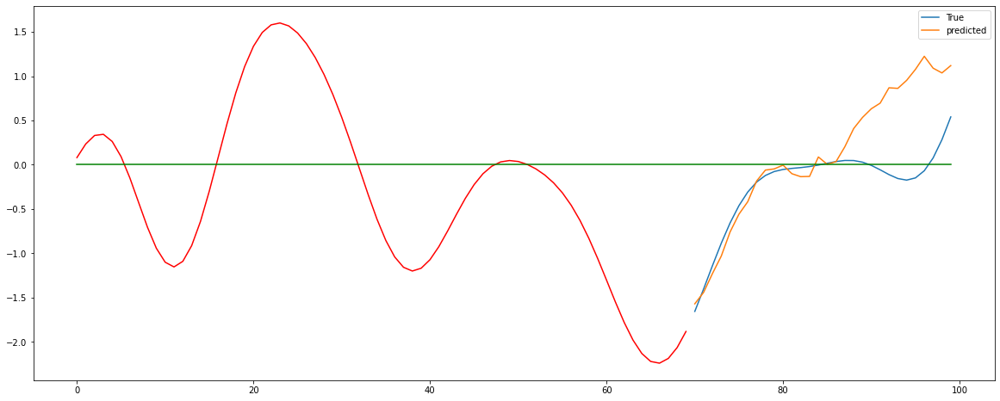

300


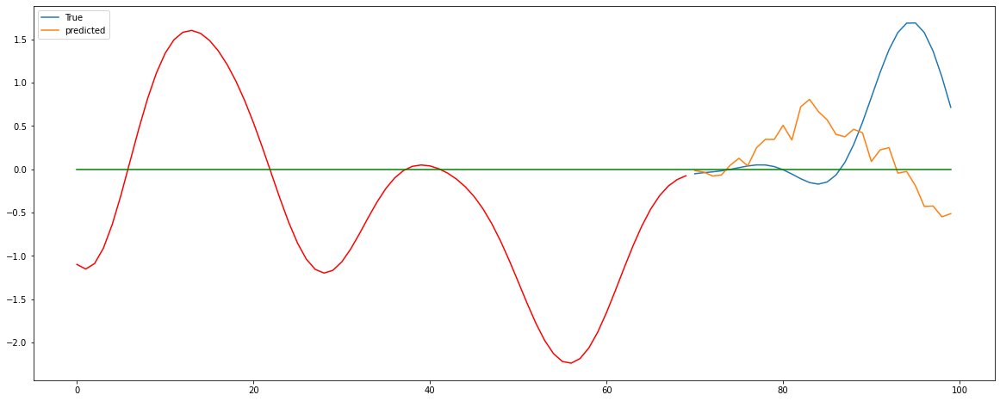

310


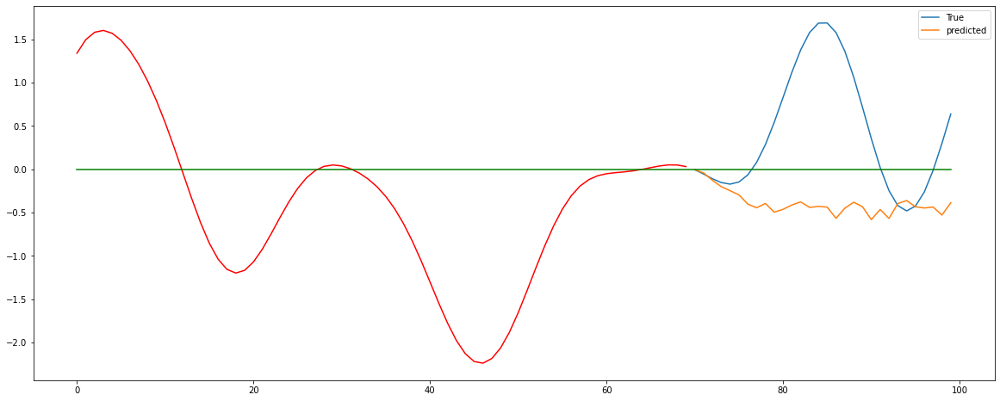

320


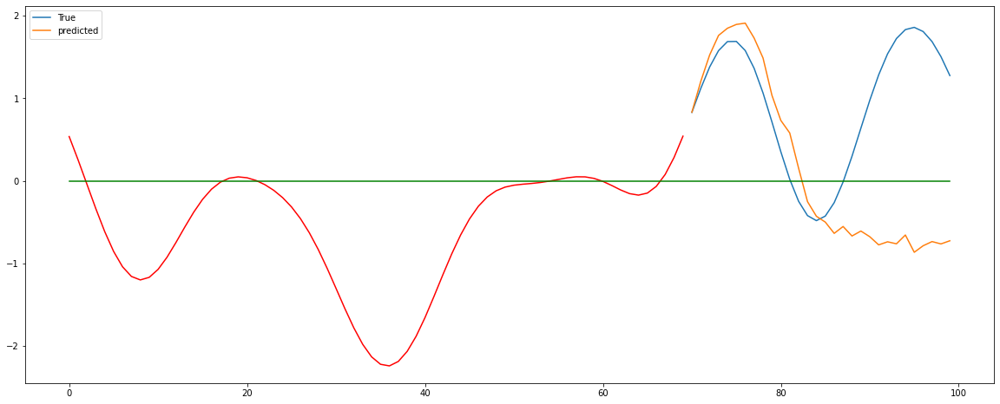

330


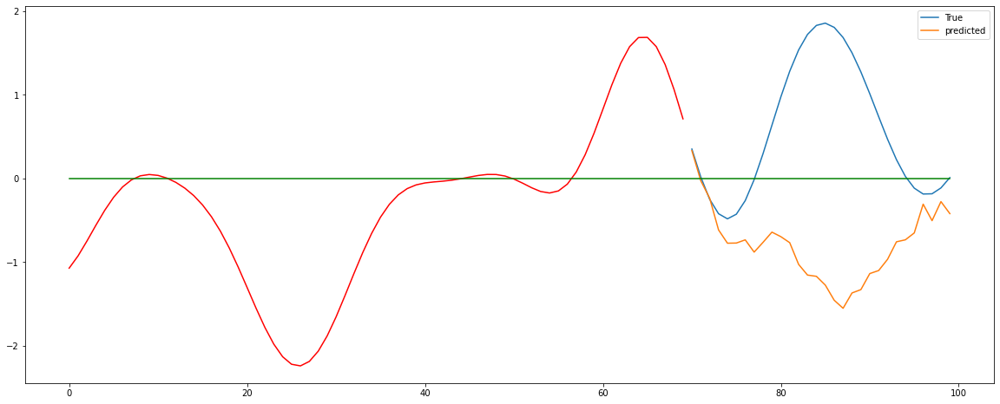

340


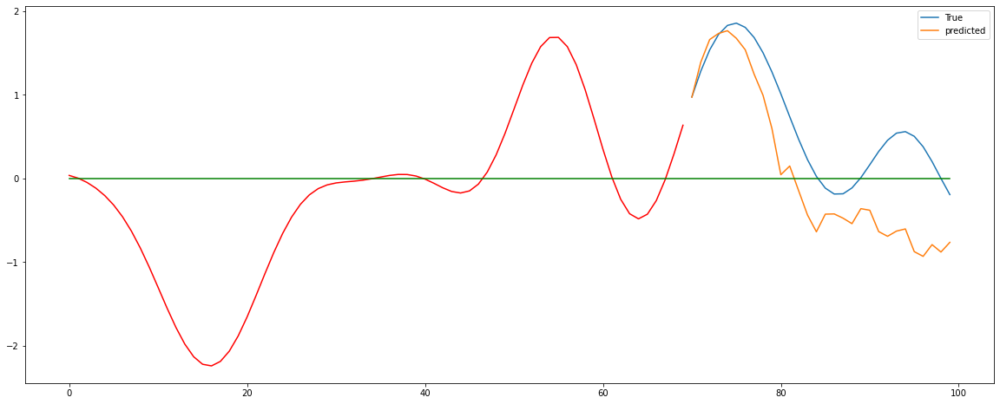

350


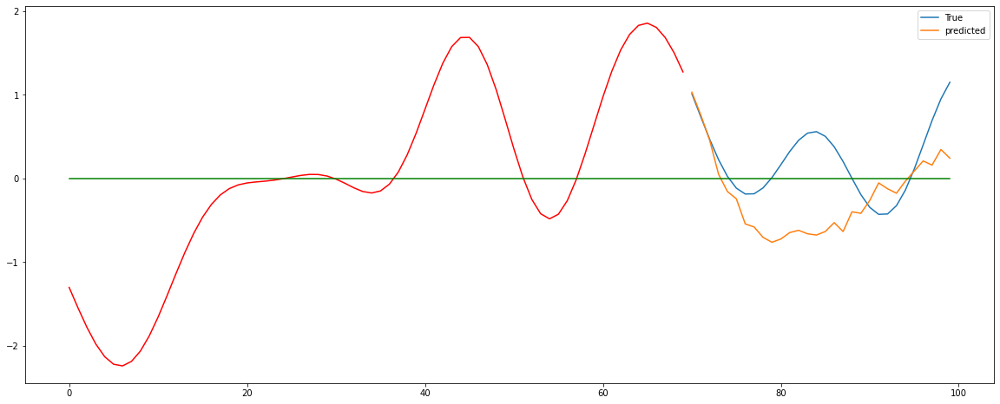

360


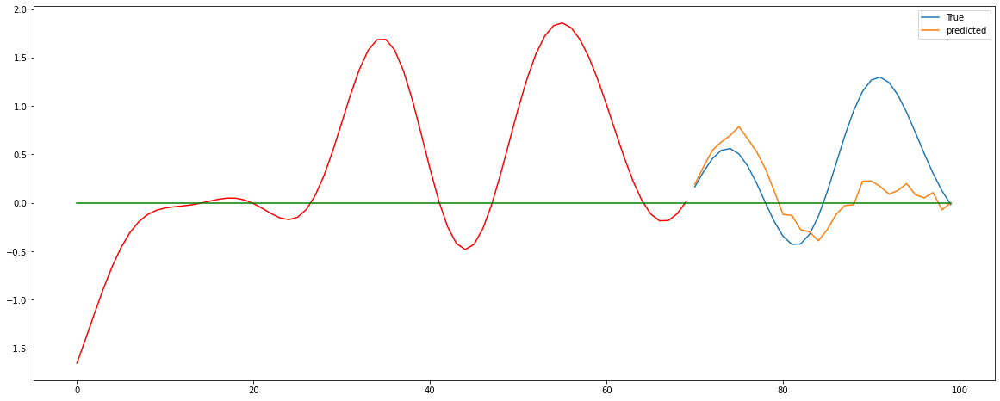

370


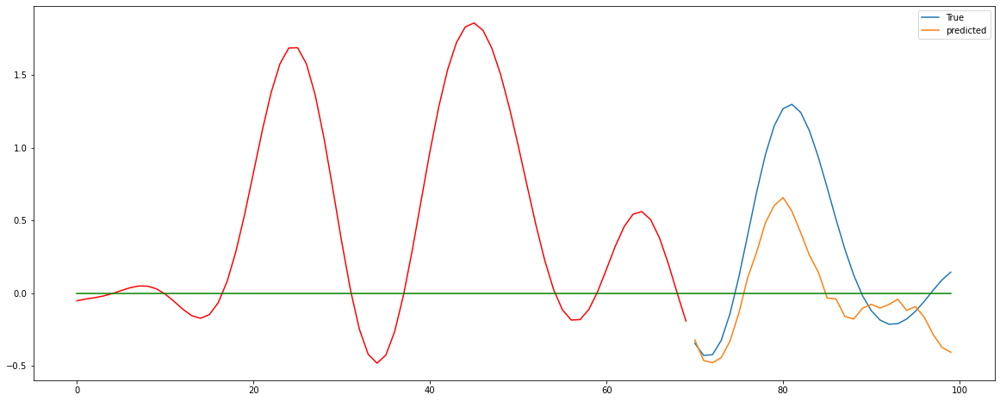

380


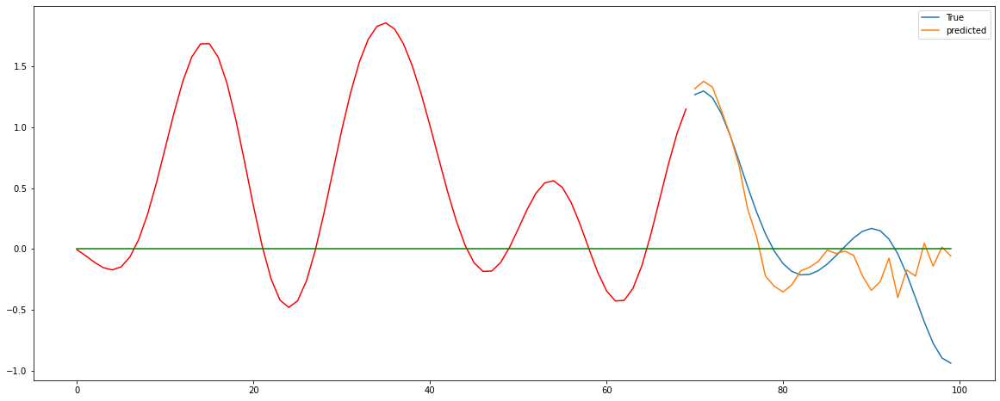

390


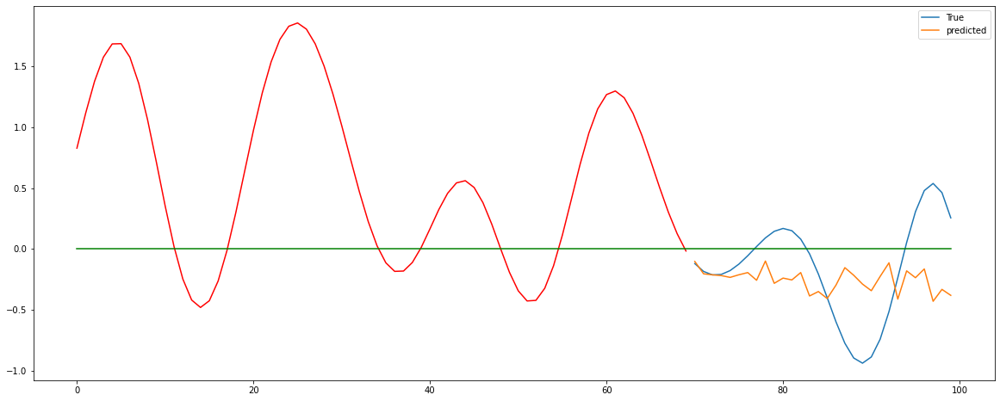

400


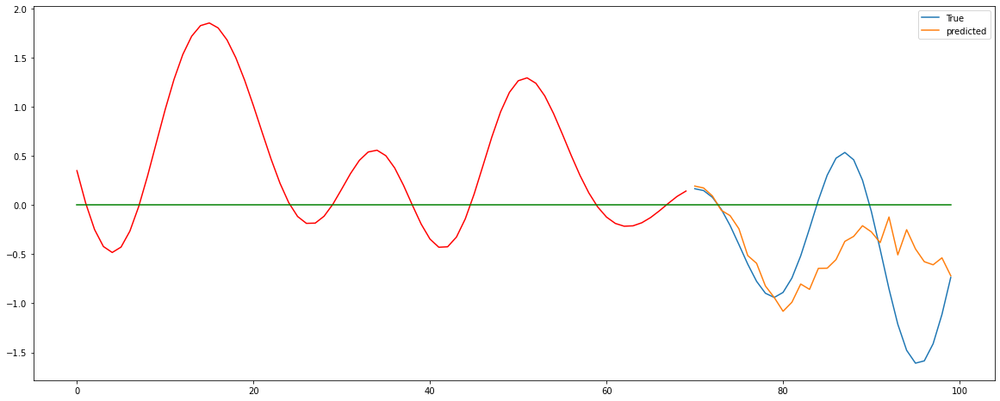

In [156]:
for i in range(0,401,10):
    print(i)
    plt.figure(figsize = (20,8))
    plt.plot(np. arange(len(x_test[i][:,0])),x_test[i][:,0],c = 'r')
    plt.plot(np.arange(70,100),y_test[i], label = 'True')
    plt.plot(np.arange(70,100), predicted[i], label = 'predicted')
    plt.plot(np.arange(100), np.zeros(100),c = 'g')
    plt.legend()
    plt.show()

In [413]:
for in  

30

In [435]:
predicted[0]

array([-0.8440274 , -0.66701406, -0.47191465, -0.29593146, -0.06189094,
        0.06457072,  0.10263784,  0.09466387, -0.04367504, -0.22920038,
       -0.17606   , -0.3248867 , -0.59054744, -0.7207522 , -0.7872778 ,
       -1.0193877 , -1.0435277 , -1.1042583 , -1.0813727 , -1.1008906 ,
       -1.0839463 , -1.0296458 , -0.97729594, -0.87419057, -0.7841711 ,
       -0.6853636 , -0.6165625 , -0.42414027, -0.36310804, -0.26155087],
      dtype=float32)